In [1]:
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns 
%matplotlib inline
import statsmodels.formula.api as smf
from statsmodels.api import qqplot

plt.rcParams['font.family'] = 'NanumGothic'
mpl.rcParams['axes.unicode_minus'] = False


In [2]:
df = pd.read_csv("./preprocessed_data.csv", encoding="euc-kr")
df.head()

,Location,Price,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Seats,Mileage(km/L),Engine(CC),Power(bhp),Brand,Country,Continent,Price_Cat,City_population,Name
0,Mumbai,2682.68,2010,72000,CNG,Manual,First,5.0,26.60,998.0,58.16,Maruti,India,Asia,c1,20961,Maruti Wagon R LXI CNG
1,Pune,19162.00,2015,41000,Diesel,Manual,First,5.0,19.67,1582.0,126.20,Hyundai,Korea,Asia,c4,6987,Hyundai Creta 1.6 CRDi SX Option
2,Chennai,6898.32,2011,46000,Petrol,Manual,First,5.0,18.20,1199.0,88.70,Honda,Japan,Asia,c2,11503,Honda Jazz V
3,Chennai,9197.76,2012,87000,Diesel,Manual,First,7.0,20.77,1248.0,88.76,Maruti,India,Asia,c3,11503,Maruti Ertiga VDI
4,Coimbatore,27194.71,2013,40670,Diesel,Automatic,Second,5.0,15.20,1968.0,140.80,Audi,Germany,Europe,c4,2935,Audi A4 New 2.0 TDI Multitronic


### 브랜드

브랜드별 판매량 히스토그램

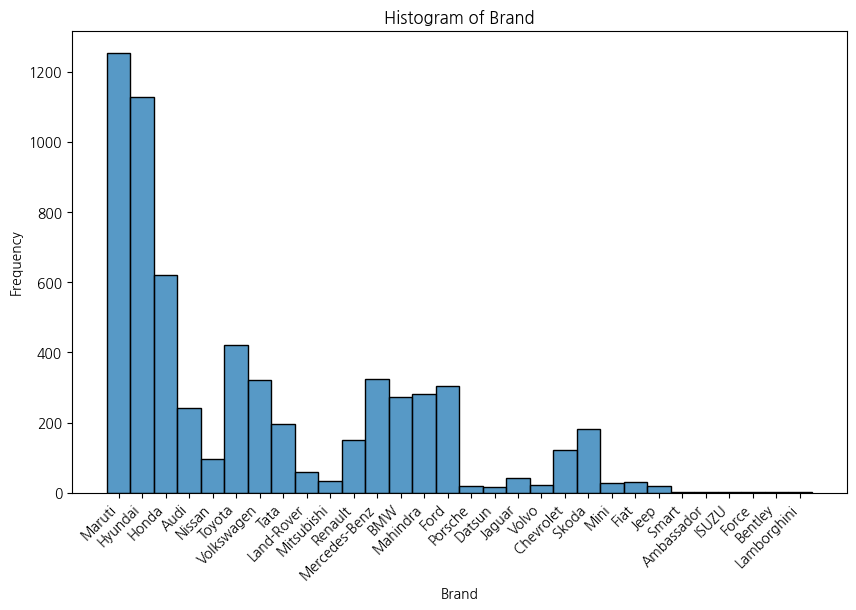

In [3]:
brand_counts = df['Brand'].value_counts()


plt.figure(figsize=(10,6))
# seaborn을 사용하여 막대 그래프 그리기
sns.histplot(data=df, x='Brand', discrete=True)
# sns.histplot(data=df, x='Brand', y=brand_means, discrete=True)
plt.xlabel('Brand')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Frequency')
plt.title('Histogram of Brand')

plt.show()


Maruti, Hyundai, Honda 순으로 많이 팔렸고 Lamborghini Bentley, Force, ISUZU, Ambassader, Smart는 거의 팔리지 않았다.

브랜드별 평균 가격

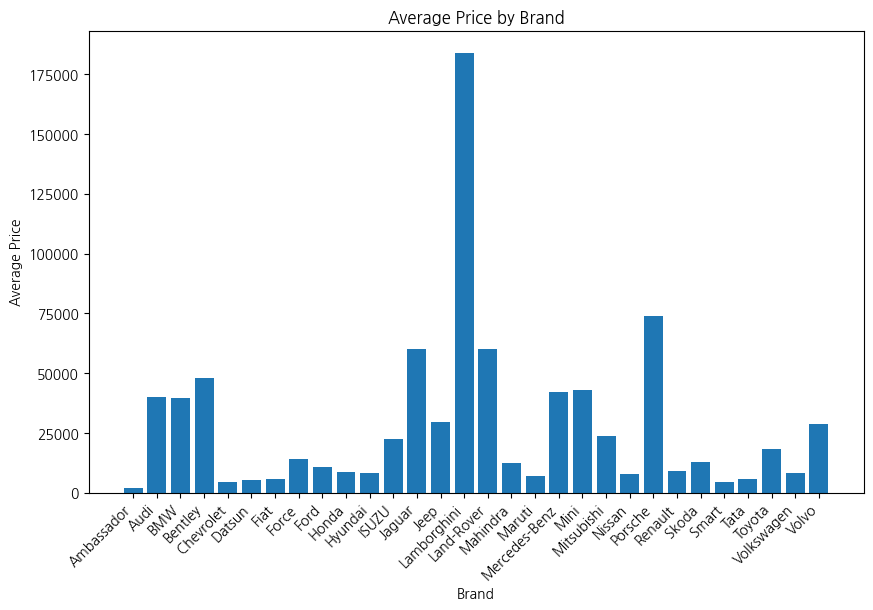

In [4]:
brand_means = df.groupby('Brand')['Price'].mean()

plt.figure(figsize=(10,6))
# 각 브랜드별 평균 가격을 막대 그래프로 그리기
plt.bar(brand_means.index, brand_means.values)

plt.xlabel('Brand')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Average Price')
plt.title('Average Price by Brand')

plt.show()


평균가격은 Lamborghini가 가장 높고, Ambassador가 가장 낮았다.

브랜드별 지역별 판매량 (나중에 지도)

In [5]:
# location_counts = df.groupby('Brand')['Location'].value_counts()
# location_counts.to_frame()

In [6]:
# # 그룹화된 데이터를 DataFrame으로 변환
# brand_location_counts_df = location_counts.reset_index(name='Count')

# # 그래프 그리기
# plt.figure(figsize=(12, 8))
# sns.barplot(data=brand_location_counts_df, x='Brand', y='Count', hue='Location')
# plt.title('Location Count by Brand')
# plt.xlabel('Brand')
# plt.ylabel('Count')
# plt.xticks(rotation=45)
# plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')

# plt.show()

## Year

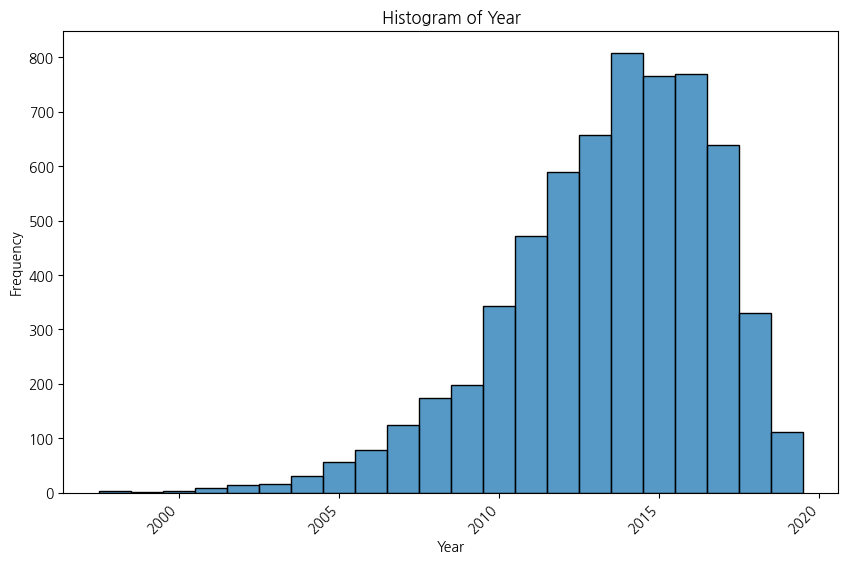

In [7]:
year_counts = df['Year'].value_counts()


plt.figure(figsize=(10,6))
# seaborn을 사용하여 막대 그래프 그리기
sns.histplot(data=df, x='Year', discrete=True)
# sns.histplot(data=df, x='Brand', y=brand_means, discrete=True)
plt.xlabel('Year')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Frequency')
plt.title('Histogram of Year')

plt.show()


연식은 2010~2017의 중고차가 많이 팔렸다.

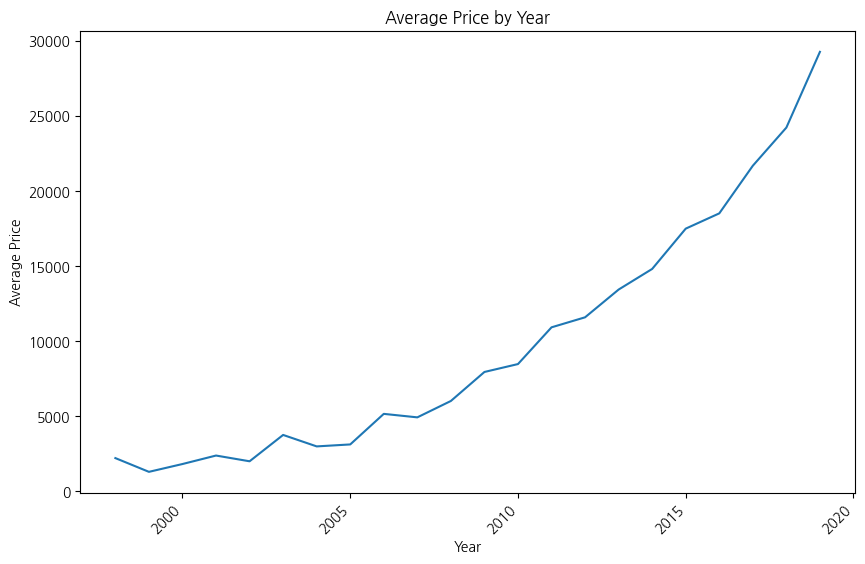

In [8]:
year_means = df.groupby('Year')['Price'].mean()

plt.figure(figsize=(10,6))
# 각 브랜드별 평균 가격을 막대 그래프로 그리기
plt.plot(year_means.index, year_means.values)

plt.xlabel('Year')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Average Price')
plt.title('Average Price by Year')

plt.show()


중고차의 평균가격은 연식이 올라갈 수록 비싼 것을 알 수 있다.

## Kilometers_Driven

In [9]:
# 범주형 데이터 생성
# 사분위 참고
df['Kilometers_Driven'].describe()
df['Kilometers_Driven_Range'] = pd.cut(df['Kilometers_Driven'], 
                                 bins=[0, 10000, 30000, 50000, 70000, float('inf')],
                                 labels=['1 or less', '1 to 3', '3 to 5', '5 to 7', '7 or more'])
df['Kilometers_Driven_Range']

0       7 or more
1          3 to 5
2          3 to 5
3       7 or more
4          3 to 5
          ...    
6192       3 to 5
6193       3 to 5
6194       3 to 5
6195    1 or less
6196       1 to 3
Name: Kilometers_Driven_Range, Length: 6197, dtype: category
Categories (5, object): ['1 or less' < '1 to 3' < '3 to 5' < '5 to 7' < '7 or more']

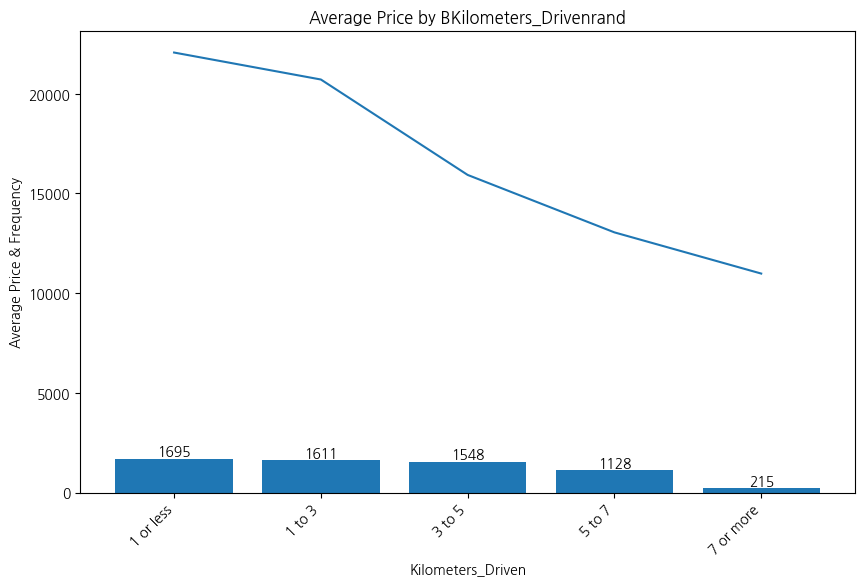

In [10]:
Kilometers_Driven_means = df.groupby('Kilometers_Driven_Range')['Price'].mean()

plt.figure(figsize=(10,6))

plt.plot(Kilometers_Driven_means.index, Kilometers_Driven_means.values.round(3))
plt.bar(Kilometers_Driven_means.index, df["Kilometers_Driven_Range"].value_counts())
for i, v in enumerate(df["Kilometers_Driven_Range"].value_counts()):
    plt.text(i, v + 10, str(v), ha='center', va='bottom')
plt.xlabel('Kilometers_Driven')
# plt.ticklabel_format(style='plain')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Average Price & Frequency')
plt.title('Average Price by BKilometers_Drivenrand')

plt.show()


차의 주행거리가 많을 수록 가격이 싸지고 적게 팔린다.

## Fuel_Type

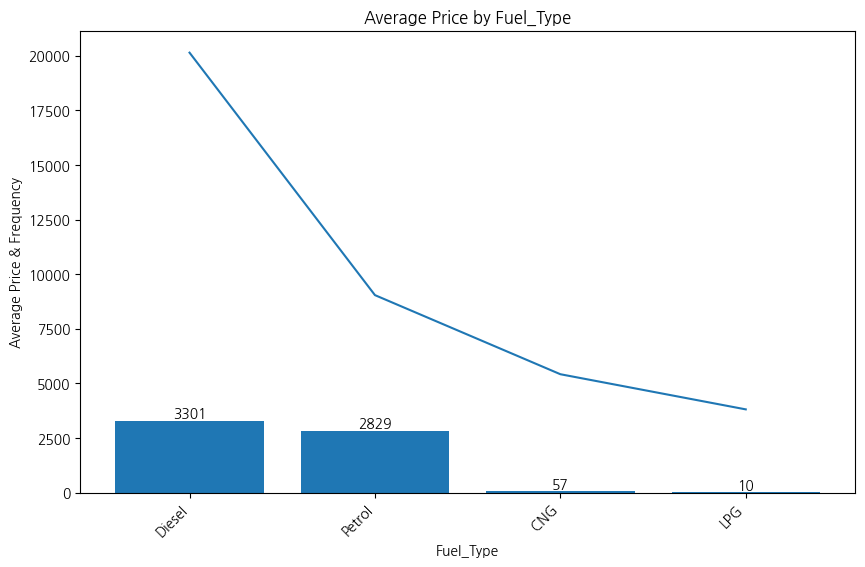

In [11]:
Fuel_Type_means = df.groupby('Fuel_Type')['Price'].mean()

new_order = ['Petrol', 'Diesel', 'Electric', 'CNG', 'LPG']
Fuel_Type_means = Fuel_Type_means.reindex(df["Fuel_Type"].value_counts().index)

plt.figure(figsize=(10,6))


plt.bar(df["Fuel_Type"].value_counts().index, df["Fuel_Type"].value_counts())
plt.plot(Fuel_Type_means.index, Fuel_Type_means.values.round(3))
for i, v in enumerate(df["Fuel_Type"].value_counts()):
    plt.text(i, v + 10, str(v), ha='center', va='bottom')
plt.xlabel('Fuel_Type')
# plt.ticklabel_format(style='plain')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Average Price & Frequency')
plt.title('Average Price by Fuel_Type')

plt.show()


In [12]:
df.groupby('Brand')['Fuel_Type'].count().to_frame()


,Fuel_Type
Brand,
Ambassador,1
Audi,241
BMW,273
Bentley,2
Chevrolet,121
Datsun,17
Fiat,31
Force,3
Ford,304


Disel, Petrol이 많이 팔리는 것을 알 수 있고 평균 가격이 Diesel보다 Petrol보다 비싸다.

## Transmission

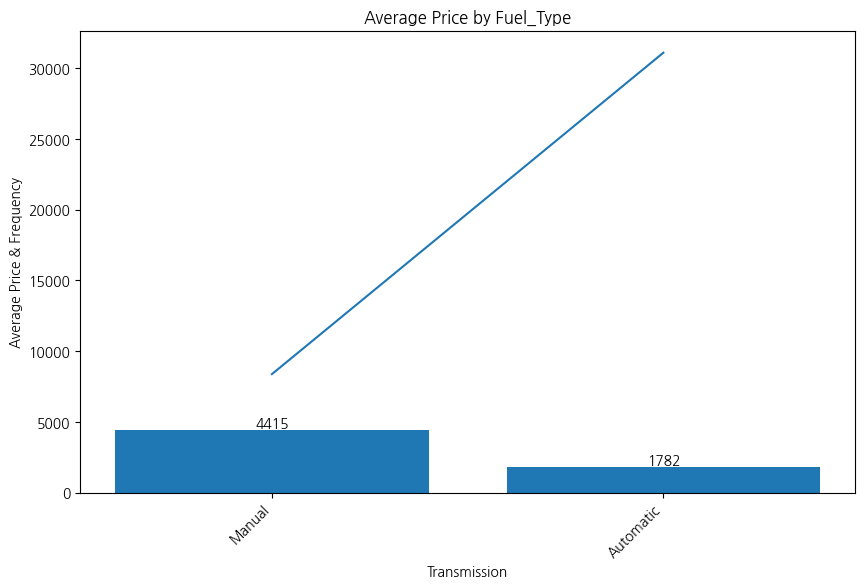

In [13]:
Transmission_means = df.groupby('Transmission')['Price'].mean()

# new_order = ['Petrol', 'Diesel', 'Electric', 'CNG', 'LPG']
# Transmission_means = Transmission_means.reindex(df["Transmission"].value_counts().index)

plt.figure(figsize=(10,6))


plt.bar(df["Transmission"].value_counts().index, df["Transmission"].value_counts())
plt.plot(Transmission_means.index, Transmission_means.values.round(3))
for i, v in enumerate(df["Transmission"].value_counts()):
    plt.text(i, v + 10, str(v), ha='center', va='bottom')
plt.xlabel('Transmission')
# plt.ticklabel_format(style='plain')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Average Price & Frequency')
plt.title('Average Price by Fuel_Type')

plt.show()


In [14]:
Transmission_means

Transmission
Automatic    31095.104209
Manual        8382.023771
Name: Price, dtype: float64

Manual이 Automatic보다 많이 팔렸고, 평균 가격이 약 세 배 싸다.

In [15]:
df["Location"].unique()

array(['Mumbai', 'Pune', 'Chennai', 'Coimbatore', 'Hyderabad', 'Jaipur',
       'Kochi', 'Kolkata', 'Delhi', 'Bangalore', 'Ahmedabad'],
      dtype=object)

## 지도 시각화

In [16]:
import folium

In [17]:
# 위도경도 데이터
latitude_and_longitude = {
    "Mumbai" : [19.079668003126226, 72.8738015131463],
    "Pune" : [18.52563420722832, 73.8615360687931],
    "Chennai" : [13.08744975281418, 80.27899011906044],
    "Coimbatore" : [11.02403446028589, 76.96516030421508],
    "Hyderabad" : [17.424373386649002, 78.46273830673218],
    "Jaipur" : [26.922794310750735, 75.78775655514467],
    "Kochi" : [9.929459067827775, 76.28576764549791],
    "Kolkata" : [22.563246479832113, 88.37137131650577],
    "Delhi" : [28.654546011295153, 77.23034266251612],
    "Bangalore" : [12.98261418460429, 77.63344190040827],
    "Ahmedabad" : [23.030014716719965, 72.60165883788045]
}

In [18]:
count_loc = df['Location'].value_counts()
count_loc

Mumbai        816
Hyderabad     759
Kochi         675
Coimbatore    664
Pune          632
Delhi         572
Kolkata       552
Chennai       505
Jaipur        424
Bangalore     365
Ahmedabad     233
Name: Location, dtype: int64

In [19]:
import folium
import json

# 인도 지도의 경계선이 포함된 GeoJSON 파일을 불러옵니다.
with open('indian-cities.geojson', 'r') as f:
    data = json.load(f)

# Folium 맵을 생성합니다.
m = folium.Map(location=[19.079668003126226, 72.8738015131463], zoom_start=10)

folium.Choropleth(
    geo_data='indian-cities.geojson', # 경계선 좌표값이 담긴 데이터
    data=count_loc, # Series or DataFrame 넣으면 된다
    # columns=['Location'], # DataFrame의 어떤 columns을 넣을지
    key_on='feature.properties.name', # id 값을 가져오겠다; feature.id : feature 붙여줘야 함 (folium의 정해진 형식)
    fill_color='BuPu',
    nan_fill_color="black",
    nan_fill_opacity=0.4,
    fill_opacity=0.8, # 색 투명도
    line_opacity=0.5, # 선 투명도
    legend_name='Unemployment rate (%)' # 범례
).add_to(m)
for city, coords in latitude_and_longitude.items():
    va = df['Location'].value_counts()[df['Location'].value_counts().index == city][0]
    popup_content = f"{city}<br>중고차 판매량:{va}"
    folium.Marker(location=coords, popup=popup_content).add_to(m)
m.save("인도지역별차판매량.html")
m
# # GeoJSON 파일을 사용하여 도시 경계선을 맵에 추가합니다.
# folium.GeoJson(data).add_to(m)
# m


In [20]:
df["Brand"].value_counts()

Maruti           1254
Hyundai          1127
Honda             622
Toyota            422
Mercedes-Benz     325
Volkswagen        321
Ford              304
Mahindra          281
BMW               273
Audi              241
Tata              195
Skoda             182
Renault           151
Chevrolet         121
Nissan             95
Land-Rover         60
Jaguar             43
Mitsubishi         34
Fiat               31
Mini               29
Volvo              21
Jeep               19
Porsche            18
Datsun             17
ISUZU               3
Force               3
Bentley             2
Smart               1
Ambassador          1
Lamborghini         1
Name: Brand, dtype: int64

In [21]:
# df[df["Brand"]=="Hyundai"]
loc_count = df.groupby('Brand')['Location'].value_counts()
# test.to_frame()
# loc_count["Hyundai"].loc[loc_count["Hyundai"].index == "Hyderabad"][0]
# loc_count["Hyundai"][loc_count["Hyundai"].index == "Ernakulam"][0]
loc_count

Brand       Location  
Ambassador  Chennai        1
Audi        Coimbatore    52
            Bangalore     32
            Hyderabad     32
            Delhi         27
                          ..
Volvo       Chennai        2
            Pune           2
            Coimbatore     1
            Delhi          1
            Mumbai         1
Name: Location, Length: 257, dtype: int64

In [22]:
# loc_count.to_frame()

# va = loc_count["Maruti"][loc_count["Maruti"].index == city][0]

### 제일 많이 팔린 브랜드 Top3 지역조사

In [23]:
# Maruti 지역별 판매량
with open('indian-cities.geojson', 'r') as f:
    data = json.load(f)

# Folium 맵을 생성합니다.
m = folium.Map(location=[19.079668003126226, 72.8738015131463], zoom_start=10)

folium.Choropleth(
    geo_data='indian-cities.geojson', # 경계선 좌표값이 담긴 데이터
    data=loc_count["Maruti"], # 지역별 현대 판매량
    # columns=['Location'], # DataFrame의 어떤 columns을 넣을지
    key_on='feature.properties.name', # id 값을 가져오겠다; feature.id : feature 붙여줘야 함 (folium의 정해진 형식)
    fill_color='BuPu',
    nan_fill_color="black",
    nan_fill_opacity=0.4,
    fill_opacity=0.8, # 색 투명도
    line_opacity=0.5, # 선 투명도
    legend_name='Unemployment rate (%)' # 범례
).add_to(m)
for city, coords in latitude_and_longitude.items():
    va = loc_count["Maruti"][loc_count["Maruti"].index == city][0]
    # print(va)
    popup_content = f"{city}<br>Maruti 판매량:{va}"
    # # popup_content = "<b>{}</b><br>위도: {}<br>경도: {}".format(city, coords[0], coords[1])
    folium.Marker(location=coords, popup=popup_content).add_to(m)
m.save("지역별Maruti판매량.html")
m

In [24]:
# Hyundai 지역별 판매량
with open('indian-cities.geojson', 'r') as f:
    data = json.load(f)

# Folium 맵을 생성합니다.
m = folium.Map(location=[19.079668003126226, 72.8738015131463], zoom_start=10)

folium.Choropleth(
    geo_data='indian-cities.geojson', # 경계선 좌표값이 담긴 데이터
    data=loc_count["Hyundai"], # 지역별 현대 판매량
    # columns=['Location'], # DataFrame의 어떤 columns을 넣을지
    key_on='feature.properties.name', # id 값을 가져오겠다; feature.id : feature 붙여줘야 함 (folium의 정해진 형식)
    fill_color='BuPu',
    nan_fill_color="black",
    nan_fill_opacity=0.4,
    fill_opacity=0.8, # 색 투명도
    line_opacity=0.5, # 선 투명도
    legend_name='Unemployment rate (%)' # 범례
).add_to(m)
for city, coords in latitude_and_longitude.items():
    va = loc_count["Hyundai"][loc_count["Hyundai"].index == city][0]
    # print(va)
    popup_content = f"{city}<br>Hyundai 판매량:{va}"
    # # popup_content = "<b>{}</b><br>위도: {}<br>경도: {}".format(city, coords[0], coords[1])
    folium.Marker(location=coords, popup=popup_content).add_to(m)
m.save("지역별Hyundai판매량.html")
m

In [25]:
# Honda 지역별 판매량
with open('indian-cities.geojson', 'r') as f:
    data = json.load(f)

# Folium 맵을 생성합니다.
m = folium.Map(location=[19.079668003126226, 72.8738015131463], zoom_start=10)

folium.Choropleth(
    geo_data='indian-cities.geojson', # 경계선 좌표값이 담긴 데이터
    data=loc_count["Honda"], # 지역별 현대 판매량
    # columns=['Location'], # DataFrame의 어떤 columns을 넣을지
    key_on='feature.properties.name', # id 값을 가져오겠다; feature.id : feature 붙여줘야 함 (folium의 정해진 형식)
    fill_color='BuPu',
    nan_fill_color="black",
    nan_fill_opacity=0.4,
    fill_opacity=0.8, # 색 투명도
    line_opacity=0.5, # 선 투명도
    legend_name='Unemployment rate (%)' # 범례
).add_to(m)
for city, coords in latitude_and_longitude.items():
    va = loc_count["Honda"][loc_count["Honda"].index == city][0]
    # print(va)
    popup_content = f"{city}<br>Honda 판매량:{va}"
    # # popup_content = "<b>{}</b><br>위도: {}<br>경도: {}".format(city, coords[0], coords[1])
    folium.Marker(location=coords, popup=popup_content).add_to(m)
m.save("지역별Honda판매량.html")
m

In [26]:
# latitude_and_longitude.keys()
# print(zip(loc_count.loc[:, "Mumbai"].sort_values(ascending=False)[:3].keys(), loc_count.loc[:, "Mumbai"].sort_values(ascending=False)[:3].values))
list(loc_count.loc[:, "Mumbai"].sort_values(ascending=False)[:3].keys())

['Maruti', 'Hyundai', 'Honda']

In [27]:
loc_count.to_frame()

Location
Brand      Location            
Ambassador Chennai            1
Audi       Coimbatore        52
           Bangalore         32
           Hyderabad         32
           Delhi             27
...                         ...
Volvo      Chennai            2
           Pune               2
           Coimbatore         1
           Delhi              1
           Mumbai             1

[257 rows x 1 columns]

In [28]:
# 지역별 가장 많이 팔린 브랜드 top 3
with open('indian-cities.geojson', 'r') as f:
    data = json.load(f)

# Folium 맵을 생성합니다.
m = folium.Map(location=[19.079668003126226, 72.8738015131463], zoom_start=10)

folium.Choropleth(
    geo_data='indian-cities.geojson', # 경계선 좌표값이 담긴 데이터
    data=count_loc, # Series or DataFrame 넣으면 된다
    # columns=['Location'], # DataFrame의 어떤 columns을 넣을지
    key_on='feature.properties.name', # id 값을 가져오겠다; feature.id : feature 붙여줘야 함 (folium의 정해진 형식)
    fill_color='BuPu',
    nan_fill_color="black",
    nan_fill_opacity=0.4,
    fill_opacity=0.8, # 색 투명도
    line_opacity=0.5, # 선 투명도
    legend_name='Unemployment rate (%)' # 범례
).add_to(m)
for city, coords in latitude_and_longitude.items():
    bd = list(loc_count.loc[:, city].sort_values(ascending=False)[:3].keys())
    cnt = loc_count.loc[:, city].sort_values(ascending=False)[:3].values
    
    popup_content = f"{city}<br>브랜드 Top3:{bd}<br>판매량: {cnt}"
    folium.Marker(location=coords, popup=popup_content).add_to(m)
    
m.save("지역별가장많이팔린브랜드top3.html")
m